**We now arrive at the culminating section of the project. The goal of this final analysis is to assess whether rainfall intensity heavily influence dengue incidence in the Philippines. More importantly, it aims to evaluate whether rainfall data can serve as a reliable predictor of future dengue cases and potential outbreaks.**

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import math
import joblib
import shap
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from xgboost import XGBRegressor
from sklearn.linear_model import QuantileRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_pinball_loss
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit

**I loaded all of our previously preprocessed and explored datasets: the dengue case dataset, rainfall dataset, and population dataset. Initially, I first merged the dengue and population dataset prior to immediately merging the resulting dataset to the rainfall dataset.**

In [6]:
dengue = pd.read_csv('dengue.csv')
rainfall = pd.read_csv('rainfall.csv')
population = pd.read_csv('population.csv')
dengue_pop = pd.merge(dengue, population, on='Province', how='outer')
rainfall = rainfall[rainfall['Year'].between(2017, 2024)]
df = pd.merge(dengue_pop, rainfall, on=['Province', 'Year', 'Month'], how='outer')

In [7]:
df.head()

,Province,Year,Month,Region,Cases,2000,2010,2015,2016,2017,...,2023,2024,2025,cagr00_10,cagr10_15,cagr15_20,avgcagr10_20,rfh,r1q,RegionGroup
0,Abra,2017,1,CAR,13.0,209491.0,234733.0,241160.0,243112.0,245056.0,...,256445.0,258292.0,260152.0,1.14,0.54,0.8,0.72,17.2164,143.266033,Luzon
1,Abra,2017,2,CAR,11.0,209491.0,234733.0,241160.0,243112.0,245056.0,...,256445.0,258292.0,260152.0,1.14,0.54,0.8,0.72,16.5299,117.685033,Luzon
2,Abra,2017,3,CAR,17.0,209491.0,234733.0,241160.0,243112.0,245056.0,...,256445.0,258292.0,260152.0,1.14,0.54,0.8,0.72,15.4179,74.746333,Luzon
3,Abra,2017,4,CAR,2.0,209491.0,234733.0,241160.0,243112.0,245056.0,...,256445.0,258292.0,260152.0,1.14,0.54,0.8,0.72,69.2462,78.611367,Luzon
4,Abra,2017,5,CAR,10.0,209491.0,234733.0,241160.0,243112.0,245056.0,...,256445.0,258292.0,260152.0,1.14,0.54,0.8,0.72,380.1493,112.982433,Luzon


In [8]:
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7956 entries, 0 to 7955
Data columns (total 25 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Province      7956 non-null   object 
 1   Year          7956 non-null   int64  
 2   Month         7956 non-null   int64  
 3   Region        7706 non-null   object 
 4   Cases         7706 non-null   float64
 5   2000          7706 non-null   float64
 6   2010          7706 non-null   float64
 7   2015          7706 non-null   float64
 8   2016          7706 non-null   float64
 9   2017          7706 non-null   float64
 10  2018          7706 non-null   float64
 11  2019          7706 non-null   float64
 12  2020          7706 non-null   float64
 13  2021          7706 non-null   float64
 14  2022          7706 non-null   float64
 15  2023          7706 non-null   float64
 16  2024          7706 non-null   float64
 17  2025          7706 non-null   float64
 18  cagr00_10     7706 non-null 

Province          0
Year              0
Month             0
Region          250
Cases           250
2000            250
2010            250
2015            250
2016            250
2017            250
2018            250
2019            250
2020            250
2021            250
2022            250
2023            250
2024            250
2025            250
cagr00_10       250
cagr10_15       250
cagr15_20       250
avgcagr10_20    250
rfh              88
r1q              88
RegionGroup      88
dtype: int64

**After a quick exploratory analysis of missing values, I promptly realized there might be too many population columns and it might be better to reshape them into a single column. Instead of manipulating the already fully-merged dataframe "df", I decided the cleaner and more manageable approach would be to apply the pivoting to the original population dataset and then redo the merge. Accordingly, I reshaped the population dataset into a long format and then converted the values to int type.**

In [10]:
year_columns = [col for col in population.columns if col.isdigit()]
population_long = population.melt(id_vars=['Province', 'cagr00_10', 'cagr10_15', 'cagr15_20', 'avgcagr10_20'], value_vars=year_columns,
                                  var_name='Year', value_name='Population')
population_long['Year'] = population_long['Year'].astype(int)
population_long.head()

,Province,cagr00_10,cagr10_15,cagr15_20,avgcagr10_20,Year,Population
0,Abra,1.14,0.54,0.80,0.72,2000,209491
1,Agusan Del Norte,1.51,1.49,1.92,1.79,2000,552849
2,Agusan Del Sur,1.61,1.31,1.08,1.15,2000,559294
3,Aklan,1.73,1.42,1.38,1.39,2000,451314
4,Albay,1.24,1.29,0.90,1.02,2000,1090907


**This time, I decided to merge the dengue and rainfall datasets first, as they contain fewer columns than the population dataset. Merging them first also allowed for a cleaner join using three join keys. Had I merged dengue with population first using only two keys, and then subsequently merged with rainfall using three keys, it would have been more complex. Moreover, the rainfall dataset had already been pre-filtered to the relevant time range (2017–2024), which made the dengue–rainfall merge more straightforward.**

In [12]:
dengue_rain = pd.merge(dengue, rainfall, on=['Province', 'Year', 'Month'], how='outer')
dengue_rain.head()

,Province,Year,Month,Region,Cases,rfh,r1q,RegionGroup
0,Abra,2017,1,CAR,13.0,17.2164,143.266033,Luzon
1,Abra,2017,2,CAR,11.0,16.5299,117.685033,Luzon
2,Abra,2017,3,CAR,17.0,15.4179,74.746333,Luzon
3,Abra,2017,4,CAR,2.0,69.2462,78.611367,Luzon
4,Abra,2017,5,CAR,10.0,380.1493,112.982433,Luzon


In [13]:
dengue_rain.info()
dengue_rain.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7956 entries, 0 to 7955
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Province     7956 non-null   object 
 1   Year         7956 non-null   int64  
 2   Month        7956 non-null   int64  
 3   Region       7706 non-null   object 
 4   Cases        7706 non-null   float64
 5   rfh          7868 non-null   float64
 6   r1q          7868 non-null   float64
 7   RegionGroup  7868 non-null   object 
dtypes: float64(3), int64(2), object(3)
memory usage: 497.4+ KB


Province         0
Year             0
Month            0
Region         250
Cases          250
rfh             88
r1q             88
RegionGroup     88
dtype: int64

**Following the first merge, I first made sure to clean the dataframe prior to proceeding with the full three-dataset merge. Specifically, I converted the Cases column into int type and manually added Davao Occidental to the RegionGroup list via reverse mapping. This adjustment was necesary because only the rainfall dataset contained the RegionGroup column. However, there were no rainfall records for Davao Occidental in the said dataset, hence, it was also not included in the mapping dictionary. After rechecking the column properties, I deemed the cleaned dataframe ready for the final merge.**

In [15]:
dengue_rain['Cases'] = pd.to_numeric(dengue_rain['Cases'], errors='coerce').astype('Int64')
region_group_map = rainfall.set_index("Province")["RegionGroup"].to_dict()
region_group_map["Davao Occidental"] = "Mindanao"
dengue_rain["RegionGroup"] = dengue_rain["Province"].map(region_group_map)
dengue_rain.info()
dengue_rain.isnull().sum()

# missing rfh and r1q are from Davao Occidental, which is absent from rainfall dataset
# 250 cases are actually missing/skipped reports

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7956 entries, 0 to 7955
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Province     7956 non-null   object 
 1   Year         7956 non-null   int64  
 2   Month        7956 non-null   int64  
 3   Region       7706 non-null   object 
 4   Cases        7706 non-null   Int64  
 5   rfh          7868 non-null   float64
 6   r1q          7868 non-null   float64
 7   RegionGroup  7956 non-null   object 
dtypes: Int64(1), float64(2), int64(2), object(3)
memory usage: 505.1+ KB


Province         0
Year             0
Month            0
Region         250
Cases          250
rfh             88
r1q             88
RegionGroup      0
dtype: int64

**Prior to final merging, I first filtered the reshaped population dataset to include only the years 2017-2024. This step prevented the population data from 2000, 2010, 2015, and 2016 from being included in the final dataframe.**

In [17]:
filtered_pop = population_long[population_long['Year'].between(2017, 2024)]
df = pd.merge(dengue_rain, filtered_pop, on=['Province', 'Year'], how='outer')
df.head()

,Province,Year,Month,Region,Cases,rfh,r1q,RegionGroup,cagr00_10,cagr10_15,cagr15_20,avgcagr10_20,Population
0,Abra,2017,1,CAR,13,17.2164,143.266033,Luzon,1.14,0.54,0.8,0.72,245056
1,Abra,2017,2,CAR,11,16.5299,117.685033,Luzon,1.14,0.54,0.8,0.72,245056
2,Abra,2017,3,CAR,17,15.4179,74.746333,Luzon,1.14,0.54,0.8,0.72,245056
3,Abra,2017,4,CAR,2,69.2462,78.611367,Luzon,1.14,0.54,0.8,0.72,245056
4,Abra,2017,5,CAR,10,380.1493,112.982433,Luzon,1.14,0.54,0.8,0.72,245056


In [18]:
df.info()
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7956 entries, 0 to 7955
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Province      7956 non-null   object 
 1   Year          7956 non-null   int64  
 2   Month         7956 non-null   int64  
 3   Region        7706 non-null   object 
 4   Cases         7706 non-null   Int64  
 5   rfh           7868 non-null   float64
 6   r1q           7868 non-null   float64
 7   RegionGroup   7956 non-null   object 
 8   cagr00_10     7956 non-null   float64
 9   cagr10_15     7956 non-null   float64
 10  cagr15_20     7956 non-null   float64
 11  avgcagr10_20  7956 non-null   float64
 12  Population    7956 non-null   int64  
dtypes: Int64(1), float64(6), int64(3), object(3)
memory usage: 815.9+ KB


Province          0
Year              0
Month             0
Region          250
Cases           250
rfh              88
r1q              88
RegionGroup       0
cagr00_10         0
cagr10_15         0
cagr15_20         0
avgcagr10_20      0
Population        0
dtype: int64

**Upon review of the full merge, I confirmed that the population dataset was integrated seamlessly. Therefore, I proceeded to create a new column for dengue incidence rate, calculated as cases per 100,000 population.**

In [20]:
df['Per_100k'] = (df['Cases'] / df['Population']) * 100000
df['Per_100k'] = pd.to_numeric(df['Per_100k'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7956 entries, 0 to 7955
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Province      7956 non-null   object 
 1   Year          7956 non-null   int64  
 2   Month         7956 non-null   int64  
 3   Region        7706 non-null   object 
 4   Cases         7706 non-null   Int64  
 5   rfh           7868 non-null   float64
 6   r1q           7868 non-null   float64
 7   RegionGroup   7956 non-null   object 
 8   cagr00_10     7956 non-null   float64
 9   cagr10_15     7956 non-null   float64
 10  cagr15_20     7956 non-null   float64
 11  avgcagr10_20  7956 non-null   float64
 12  Population    7956 non-null   int64  
 13  Per_100k      7706 non-null   Float64
dtypes: Float64(1), Int64(1), float64(6), int64(3), object(3)
memory usage: 885.9+ KB


In [21]:
df.head()

,Province,Year,Month,Region,Cases,rfh,r1q,RegionGroup,cagr00_10,cagr10_15,cagr15_20,avgcagr10_20,Population,Per_100k
0,Abra,2017,1,CAR,13,17.2164,143.266033,Luzon,1.14,0.54,0.8,0.72,245056,5.30491
1,Abra,2017,2,CAR,11,16.5299,117.685033,Luzon,1.14,0.54,0.8,0.72,245056,4.48877
2,Abra,2017,3,CAR,17,15.4179,74.746333,Luzon,1.14,0.54,0.8,0.72,245056,6.93719
3,Abra,2017,4,CAR,2,69.2462,78.611367,Luzon,1.14,0.54,0.8,0.72,245056,0.81614
4,Abra,2017,5,CAR,10,380.1493,112.982433,Luzon,1.14,0.54,0.8,0.72,245056,4.0807


**The first couple of visuals displayed below are time series charts of national dengue case totals, which do not require incidence rate data. These charts were already presented in the first section of the project and are shown again here to give a snapshot of the disease burden that the country experienced during the 8-year duration, which notably includes the COVID lockdown period.**

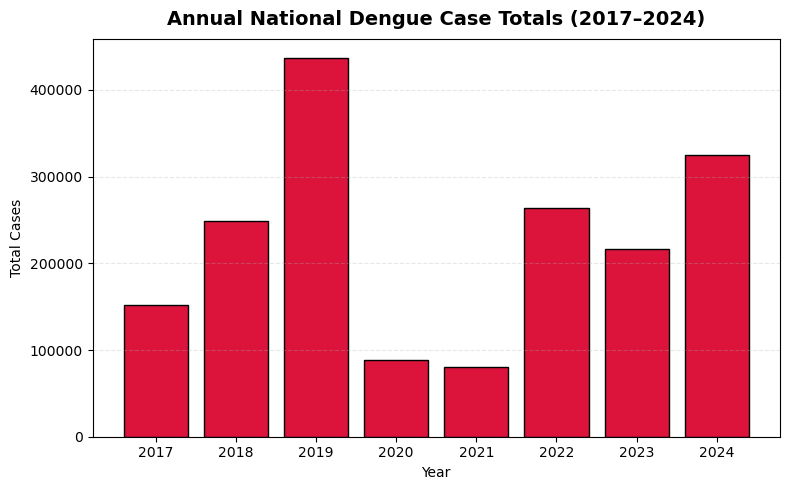

In [23]:
annual_totals = df.groupby('Year')['Cases'].sum().reset_index()

plt.figure(figsize=(8, 5))
bars = plt.bar(annual_totals['Year'], annual_totals['Cases'], color='crimson', edgecolor='black')
plt.title('Annual National Dengue Case Totals (2017–2024)', fontsize=14, weight='bold', pad=10)
plt.xlabel('Year')
plt.ylabel('Total Cases')
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.xticks(annual_totals['Year'])
plt.tight_layout()
plt.show()

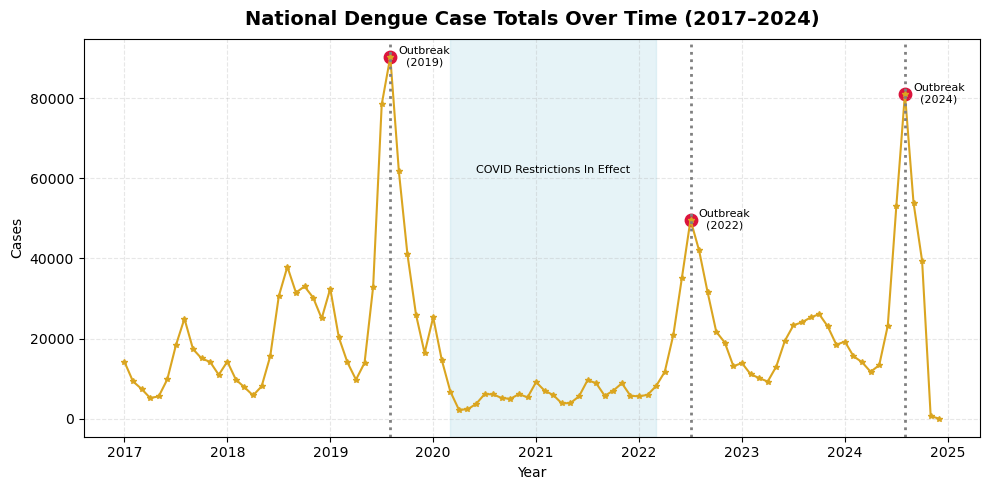

In [24]:
national_trend = df.groupby(['Year', 'Month'])['Cases'].sum().reset_index()
annual_total = national_trend.groupby('Year')['Cases'].sum()
outbreak_years = annual_total[annual_total > 200_000].index.tolist()
peak_months = national_trend[(national_trend['Year'].isin(outbreak_years)) & (national_trend['Cases'] > 40_000)]
peak_months = peak_months.loc[peak_months.groupby('Year')['Cases'].idxmax()]

plt.figure(figsize=(10, 5))
plt.plot(national_trend['Year'] + (national_trend['Month'] - 1) / 12, national_trend['Cases'], marker='*', linestyle='-', color='goldenrod', markersize=4)
plt.scatter(peak_months['Year'] + (peak_months['Month'] - 1) / 12, peak_months['Cases'], color='crimson', s=80)

for _, row in peak_months.iterrows():
    x = row['Year'] + (row['Month'] - 1) / 12
    plt.axvline(x, color='gray', linestyle=':', linewidth=2)
    plt.text(x + 0.33, row['Cases'], f"Outbreak\n({int(row['Year'])})", ha='center', va='center', fontsize=8, color='black')

plt.axvspan(2020 + 2/12, 2022 + 2/12, color='lightblue', alpha=0.3)
plt.text(2021 + 2/12, 0.7 * national_trend['Cases'].max(), 'COVID Restrictions In Effect', fontsize=8, color='black', ha='center', va='top')
plt.title('National Dengue Case Totals Over Time (2017–2024)', fontsize=14, weight='bold', pad=10)
plt.xlabel('Year')
plt.ylabel('Cases')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

**I then ranked the provinces based on their average annual and monthly dengue incidence rate. The resulting rankings featured mostly the same provinces but one key observation was particularly unexpected and appeared to challenge the conventional understanding of dengue transmission dynamics. Seven out of the top eight provinces having the highest average dengue incidence rates were landlocked, highland, mountainous provinces, with each province having an average elevation of 500 meters or higher. These provinces recorded average annual incidence rates from over 450 up to more than 800 cases per 100,000 people. For perspective, this is comparable to warm, densely-populated, lowland megacities such as Bangkok, Ho Chi Minh, Rio de Janeiro, and even Jakarta, which is often cited as having one of, if not the, highest disease burdens globally.**

**As discussed in the first section of the project, dengue occurrence is generally observed to decrease in higher elevations where temperatures are typically cooler because the dengue vector mosquito thrives better in warmer temperatures. The Aedes mosquito's complete life cycle, i.e. from egg incubation to larval development to adult feeding & breeding, have optimum temperature ranges of about 26-30°C, peaking at 28-29°C. In addition, mosquito larval & pupal development, blood-feeding, mating activity, and overall survivability are drastically impaired at temperatures below 20°C. Aside from the mosquito life cycle, the mean incubation period of the dengue virus inside the vector is more than doubled, from 7 to 15 days, when temperatures drop from 30 to 25°C. In theory, this indicates that dengue transmission rates should be slower in cooler areas than in warmer areas given identical vector populations. Adding to the puzzle, these highland provinces are not even densely populated. They are included in the Stable Rural cluster, defined in the second section of the project as provinces having a relatively small population and slow population growth. Therefore, population density is also unlikely to be a significant driver of disease transmission in these provinces. It seems that to fully understand the complex dynamics that causes this apparent mystery, it is necessary to further examine localized geographic and microclimatic conditions as well as gain a deeper understanding on human behavioral and cultural patterns that may influence disease transmission in ways not described by conventional models.**

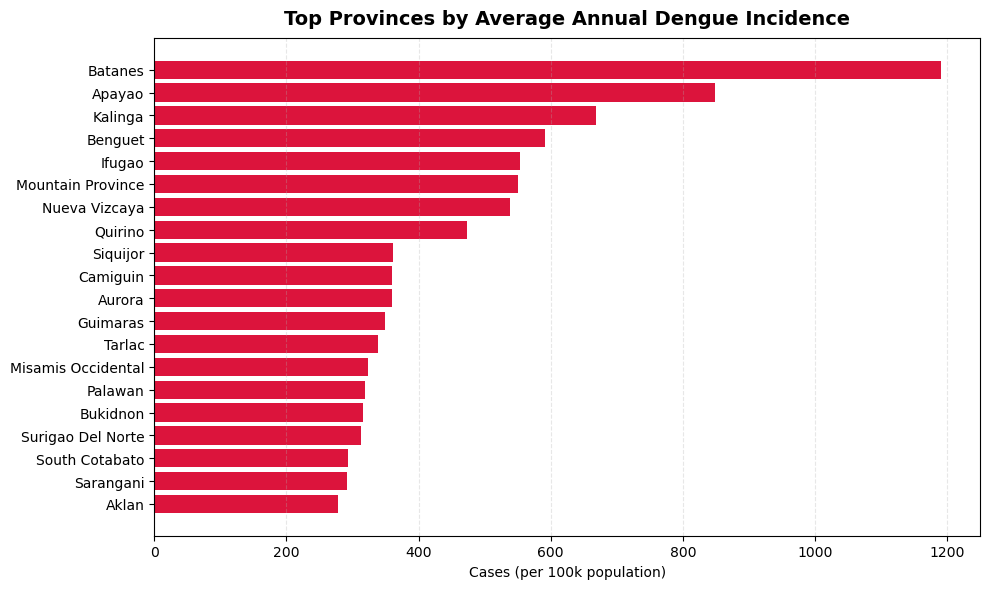

In [26]:
yearly_avg = df.groupby(['Province', 'Year'])['Per_100k'].sum().reset_index()
top_yearly_avg = yearly_avg.groupby('Province')['Per_100k'].mean().sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 6))
plt.barh(top_yearly_avg.index, top_yearly_avg.values, color='crimson', height=0.8)
plt.title('Top Provinces by Average Annual Dengue Incidence', fontsize=14, weight='bold', pad=10)
plt.xlabel('Cases (per 100k population)')
plt.gca().invert_yaxis()
plt.grid(axis='y', visible=False)
plt.grid(axis='x', visible=True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

**Aside from the "highland anomaly", another interesting insight from the visuals is that the remaining three provinces that rounded out the top 10 - alongside the seven mountainous provinces - were the three smallest island provinces in the Philippines. Each of them has a land area of less than 350 square kilometers. Particularly striking and concerning is the case of Batanes, which recorded the highest average dengue incidence over the 8-year period by a significant margin.
Batanes is the northernmost province and although the province is a collection of islets, it is regarded as the smallest island province in the country. Due to its size and remoteness, it unsurprisingly has a very small population and virtually no urban development. Its geographic isolation makes access challenging, especially by sea, and as a result, more than three years worth of dengue case data are missing from the records. This means that remarkably, albeit very disconcertingly, Batanes still reached its extremely high average incidence rate based on just about five years of available data - an alarming indication of its extreme vulnerability.**

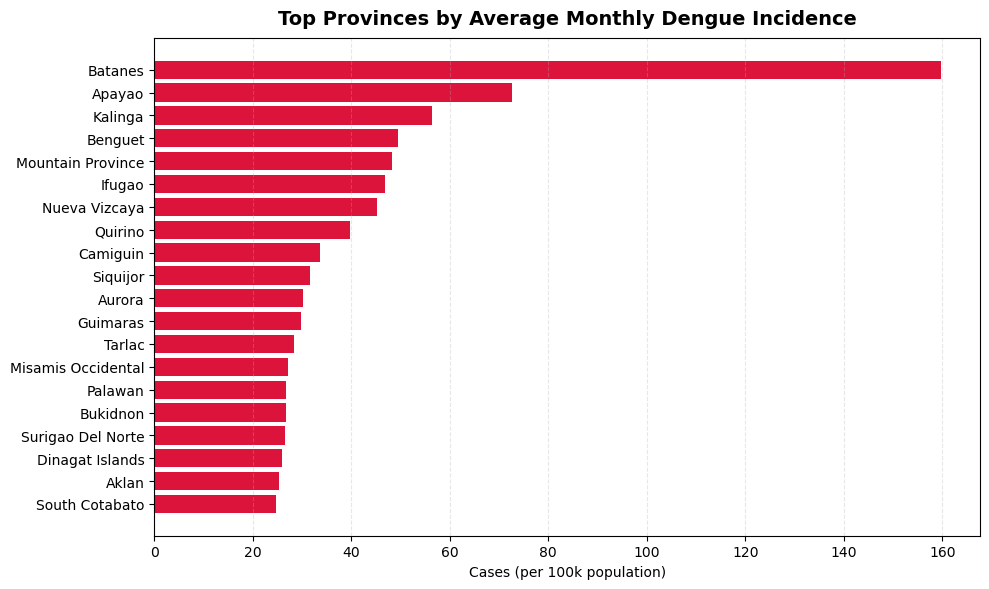

In [28]:
monthly_avg = df.groupby(['Province', 'Month'])['Per_100k'].mean().reset_index()
top_monthly_avg = monthly_avg.groupby('Province')['Per_100k'].mean().sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 6))
plt.barh(top_monthly_avg.index, top_monthly_avg.values, color='crimson', height=0.8)
plt.title('Top Provinces by Average Monthly Dengue Incidence', fontsize=14, weight='bold', pad=10)
plt.xlabel('Cases (per 100k population)')
plt.gca().invert_yaxis()
plt.grid(axis='y', visible=False)
plt.grid(axis='x', visible=True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

In [29]:
annual_incidence = df.groupby(['Province', 'Year'])['Per_100k'].sum().reset_index()
provinces = sorted(annual_incidence['Province'].unique())

fig = go.Figure()

for prov in provinces:
    data = annual_incidence[annual_incidence['Province'] == prov]
    fig.add_trace(go.Bar(x=data['Year'], y=data['Per_100k'], name=prov, visible=False, marker_color='crimson'))

buttons = [dict(label='None', method='update', args=[{'visible': [False] * len(provinces)}, {'yaxis': {'autorange': True}}])]

for i, prov in enumerate(provinces):
    visible = [False] * len(provinces)
    visible[i] = True
    buttons.append(dict(label=prov, method='update', args=[{'visible': visible}, {'yaxis': {'autorange': True}}]))

fig.update_layout(
    updatemenus=[dict(buttons=buttons, direction='down', showactive=True, x=1.02, y=0.95, xanchor='left', yanchor='top')],
    annotations=[dict(text='Select province:', x=1.02, y=1.00, xref='paper', yref='paper', xanchor='left', showarrow=False, font=dict(size=14))],
    title=dict(text='Annual Dengue Incidence Rate', font=dict(size=20, weight='bold')),
    showlegend=False,
    height=600,
    width=1000,
    xaxis_title='Year',
    yaxis_title='Incidence Rate (per 100k)')
fig.show()

**I rendered a time series heatmap showing monthly dengue incidence across all provinces over the 8-year period. The resulting plot demonstrated the steady buildup of disease incidence across the country from 2017 until 2019, when there was practically a country-wide outbreak that peaked around August. Since then, dengue incidence across the country gradually declined leading up to and throughout the two years of COVID restrictions.** 

**On cue, incidence started spiking back up in 2022 after the restrictions were officially lifted. This resurgence was especially prominent in Batanes and the highland provinces, several of which experienced consecutive months of high disease burden shortly after the strict lockdown measures were removed. During the monsoon season of that year, pockets of unusually high incidence were also observed in provinces such as Nueva Ecija, Occidental Mindoro, Cagayan, Bulacan, Aurora, and Antique.** 

**Throughout 2023, dengue burden remained relatively mild across most of the country aside from Batanes, the highland provinces, and the large island province of Palawan. In 2024, however, incidence appeared to rise sharply once again on a national scale and the nationwide total that year suggests the possible resurgence of the disease moving forward.**

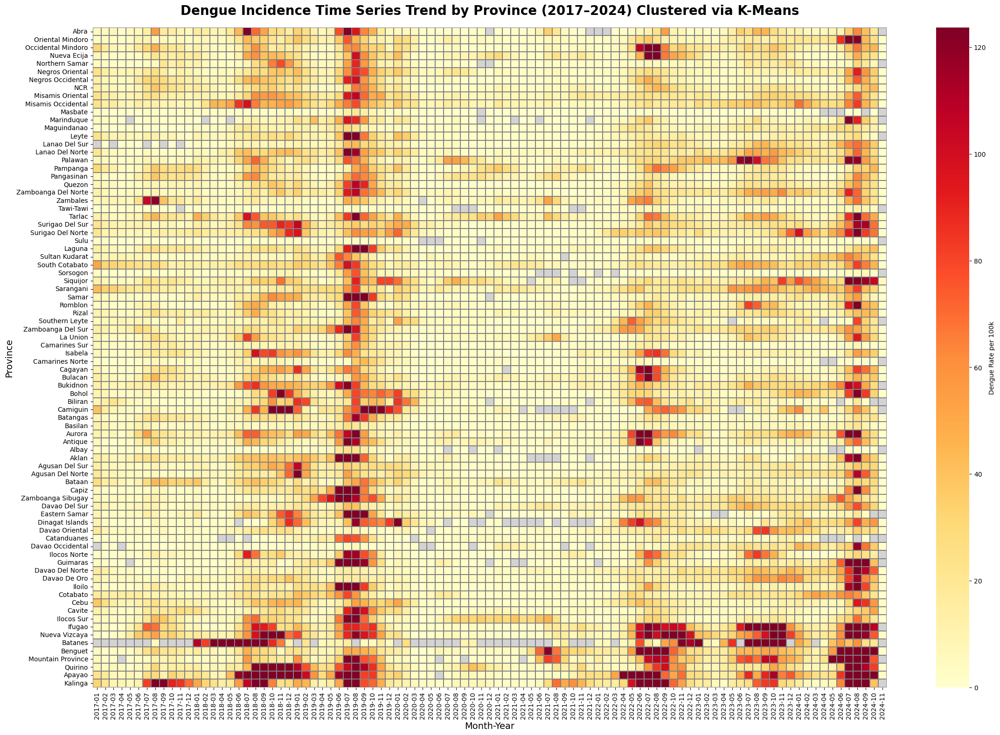

In [31]:
df_clean = df.copy()
df_clean = df_clean.dropna(subset=['Province', 'Year', 'Month', 'Per_100k'])
df_clean['Month_Year'] = df_clean['Year'].astype(str) + '-' + df_clean['Month'].astype(str).str.zfill(2)
pivot_df = df_clean.pivot_table(index='Province', columns='Month_Year', values='Per_100k', aggfunc='mean')
pivot_df = pivot_df.astype('float64')

scaler = StandardScaler()
X_scaled = scaler.fit_transform(pivot_df.fillna(0))
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

pivot_df['Cluster'] = clusters
pivot_df_sorted = pivot_df.sort_values('Cluster')
heatmap_data = pivot_df_sorted.drop(columns='Cluster')
vmin = 0
vmax = np.nanpercentile(heatmap_data.values, 98)
cmap = plt.cm.YlOrRd.copy()
cmap.set_bad(color='lightgray')
plt.figure(figsize=(24, max(8, len(pivot_df.index) * 0.2)))
ax = sns.heatmap(heatmap_data, cmap=cmap, vmin=vmin, vmax=vmax, linewidths=0.1, linecolor='gray', mask=heatmap_data.isna(),
                 cbar_kws={'label': 'Dengue Rate per 100k'}, yticklabels=True, xticklabels=True)
plt.title('Dengue Incidence Time Series Trend by Province (2017–2024) Clustered via K-Means', fontsize=20, weight='bold', pad=20)
plt.xlabel('Month-Year', fontsize=14)
plt.ylabel('Province', fontsize=14)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout(pad=3.0)
plt.show()

**To better visualize the detailed monthly and annual dengue incidence trends for each province, I generated individual heatmaps, stacking each year vertically. This format allows for quicker and more intuitive examination of each province's incidence profile over time. Unsurprisingly, the profiles of Batanes and the highland provinces stood out immediately, as they consistently experienced multiple months of excessively high dengue incidence. In addition to these, several other provinces reported outbreak-level numbers in 2019 and 2024.**

**Personally, I have limited knowledge on how the different provinces — or even the country as a whole — implement their dengue prevention strategies beyond the standard public reminders to eliminate stagnant water. I’m also skeptical on whether the relevant agencies have established metrics and contingency plans in place, especially as these long-standing awareness campaigns risk losing public attention and subsequent impact over time. What has been clear throughout this project, however, is that given the trends observed over just the past three years, more proactive and responsive measures are urgently needed.**

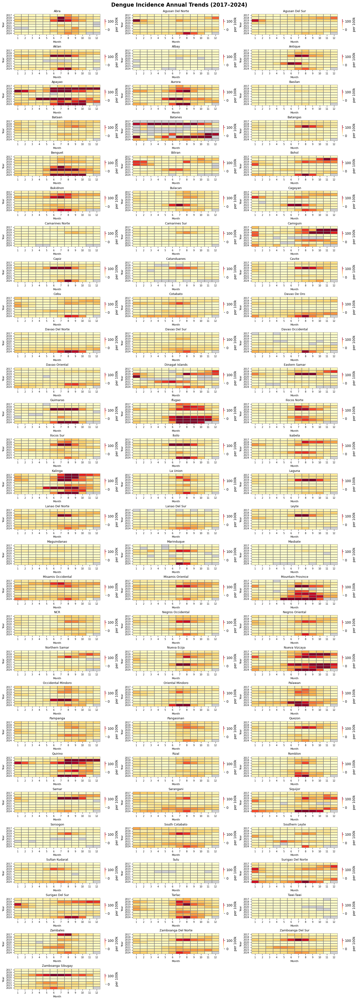

In [33]:
df_clean = df[df[['Province', 'Year', 'Month', 'Per_100k']].notnull().all(axis=1)].copy()
df_clean['Month'] = df_clean['Month'].astype(int)

provinces = sorted(df_clean['Province'].unique())
n_provinces = len(provinces)
n_cols = 3
n_rows = math.ceil(n_provinces / n_cols)

cmap = plt.cm.YlOrRd.copy()
cmap.set_bad(color='lightgray')
vmin = 0
vmax = np.percentile(df_clean['Per_100k'].dropna(), 98)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 1.5), constrained_layout=True)
axes = axes.flatten()

for i, province in enumerate(provinces):
    ax = axes[i]
    df_prov = df_clean[df_clean['Province'] == province]
    pivot = df_prov.pivot_table(index='Year', columns='Month', values='Per_100k', aggfunc='mean').sort_index().astype(float)
    sns.heatmap(pivot, cmap=cmap, vmin=vmin, vmax=vmax, linewidths=0.1, linecolor='gray', cbar=True, 
                cbar_kws={'shrink': 0.5, 'label': 'per 100k'}, xticklabels=True, yticklabels=True, ax=ax)
    ax.set_title(province, fontsize=9)
    ax.set_xlabel('Month', fontsize=8)
    ax.set_ylabel('Year', fontsize=8)
    ax.set_xticks(np.arange(0.5, 12.5, 1))
    ax.set_xticklabels([str(m) for m in range(1, 13)], fontsize=7)
    ax.tick_params(axis='y', labelsize=7)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Dengue Incidence Annual Trends (2017–2024)', fontsize=16, weight='bold')
plt.show()

**One of the primary goals of this project was to determine whether a clear and reliable correlation exists between rainfall and dengue incidence. To begin exploring this relationship, I plotted total rainfall against incidence rates across the major island groups. Results showed an almost neutral relationship between the two variables when analyzed at this broad spatial scale.**

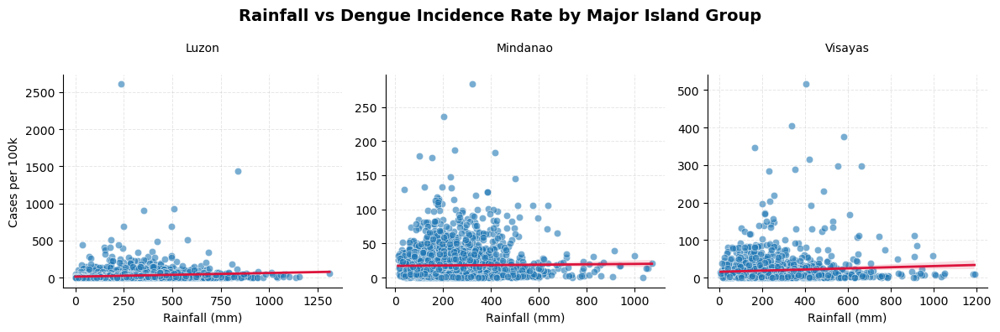

In [35]:
g = sns.FacetGrid(df, col="RegionGroup", col_wrap=3, height=4, sharex=False, sharey=False)
g.map_dataframe(sns.scatterplot, x="rfh", y="Per_100k", alpha=0.6)

for ax, region in zip(g.axes.flatten(), g.col_names):
    region_data = df[df['RegionGroup'] == region]
    sns.regplot(data=region_data, x="rfh", y="Per_100k", ax=ax, scatter=False, color='crimson', line_kws={'linewidth': 2})

g.set_titles("{col_name}", pad=20)
g.set_axis_labels("Rainfall (mm)", "Cases per 100k")
g.fig.suptitle("Rainfall vs Dengue Incidence Rate by Major Island Group", fontsize=14, weight='bold') 

for ax in g.axes.flatten():
    ax.grid(True, linestyle='--', linewidth=0.7, alpha=0.3) 

plt.tight_layout()
plt.show()

**When plotted on a yearly basis, the results varied — from a slightly negative slope in 2020, to a mostly flat slope in 2021, to barely positive slopes in 2017, 2022, and 2023, and finally to more noticeable rising slopes in 2018, 2019, and 2024. These inconsistencies highlight the unreliability of rainfall as a sole indicator of dengue incidence, even when examined on a temporal scale.**

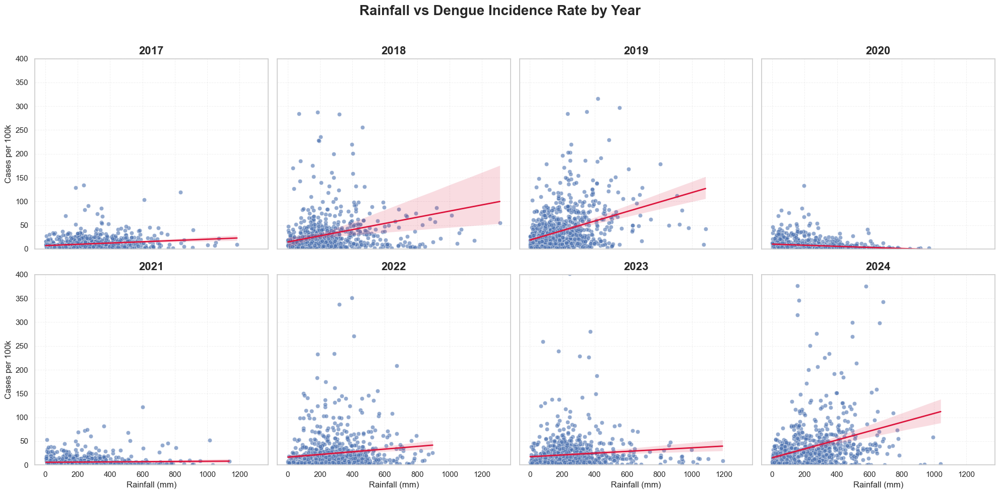

In [37]:
df_clean = df[df[['rfh', 'Per_100k', 'Year']].notnull().all(axis=1)]
years = sorted(df_clean['Year'].unique())

sns.set(style='whitegrid')
fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharex=True, sharey=True)
axes = axes.flatten()

for i, year in enumerate(years):
    data = df_clean[df_clean['Year'] == year]
    sns.scatterplot(data=data, x='rfh', y='Per_100k', ax=axes[i], alpha=0.6)
    sns.regplot(data=data, x='rfh', y='Per_100k', ax=axes[i], scatter=False, color='crimson', line_kws={'linewidth': 2})
    axes[i].set_title(f'{year}', fontsize=16, weight='bold')
    axes[i].set_xlabel('Rainfall (mm)', fontsize=12)
    axes[i].set_ylabel('Cases per 100k', fontsize=12)
    axes[i].set_ylim(0, 400) 
    axes[i].grid(True, linestyle='--', linewidth=0.7, alpha=0.3)

plt.suptitle('Rainfall vs Dengue Incidence Rate by Year', fontsize=20, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Recognizing that broad spatial and temporal scales showed very minimal correlation between rainfall and dengue incidence, I adopted a more granular approach. I generated regression plots for each province in two ways: one combining all monthly records, and another with separate plots for each year. Results showed that even at the provincial level — the smallest spatial scale that I am able to analyze — the relationship between rainfall and incidence remained inconsistent. Some provinces showed negative slopes, others flat, and some positive, with no clear geographic pattern emerging.**

**An interesting observation to note was that most provinces with positive slopes were located in Luzon, despite the collective Luzon regression plot showing an almost flat trend. Similarly, several individual Mindanao provinces showed negative slopes, even though the overall Mindanao regression plot was also nearly flat. This likely reflects an earlier observation that peak rainfall in Mindanao tends to be distributed more evenly throughout the year, potentially weakening any observable seasonal signal in the data.**

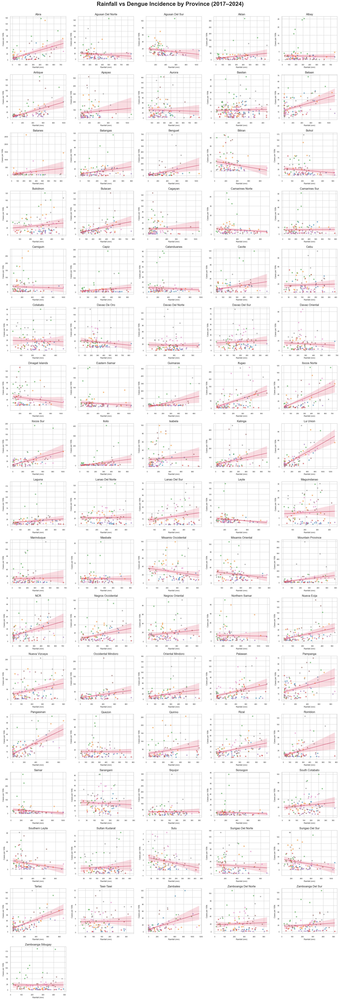

In [39]:
df_clean = df[df[['rfh', 'Per_100k', 'Province', 'Year']].notnull().all(axis=1)].copy()
provinces = sorted(df_clean['Province'].unique())
years = sorted(df_clean['Year'].unique())

cols = 5
rows = int(np.ceil(len(provinces) / cols))
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3.5), sharex=False, sharey=False)
axes = axes.flatten()

for i, province in enumerate(provinces):
    ax = axes[i]
    df_prov = df_clean[df_clean['Province'] == province]
    sns.scatterplot(data=df_prov, x='rfh', y='Per_100k', hue='Year', palette='tab10', alpha=0.6, s=30, ax=ax, legend=False)
    sns.regplot(data=df_prov, x='rfh', y='Per_100k', scatter=False, color='crimson', ax=ax, line_kws={'linewidth': 1})
    ax.set_title(province, fontsize=12)
    ax.set_xlabel("Rainfall (mm)", fontsize=8)
    ax.set_ylabel("Cases per 100k", fontsize=8)
    ax.tick_params(axis='both', labelsize=7)
    
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Rainfall vs Dengue Incidence by Province (2017–2024)", fontsize=24, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

**Examining the yearly plots for individual provinces, we can again observe the same trend variability that has been evident throughout the analysis. In general, both positive and negative slopes appear more pronounced at this level. However, the broad confidence interval bands (the light red bands around the regression line) limit our ability to draw strong conclusions.**

**Taken together, all visuals up to this point suggest that the relationship between rainfall and dengue incidence is weak and inconclusive. In practical terms, rainfall intensity alone is not a reliable indicator of whether dengue incidence will be high or low.**

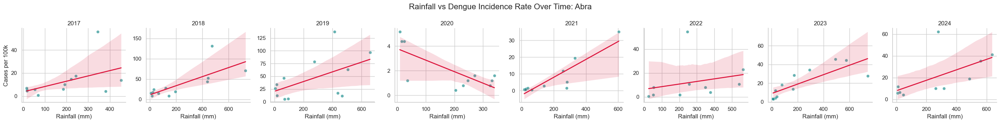

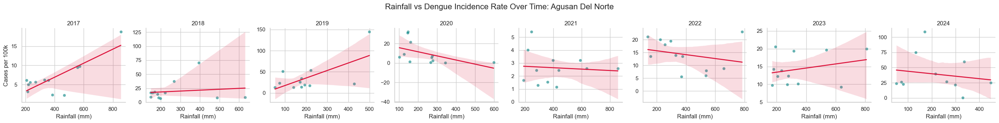

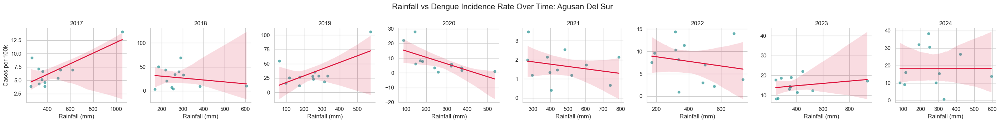

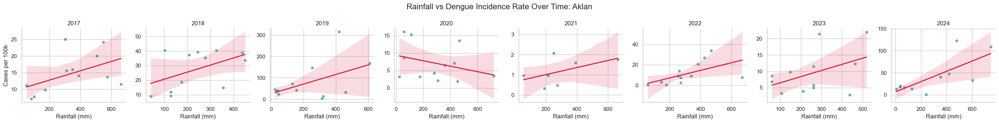

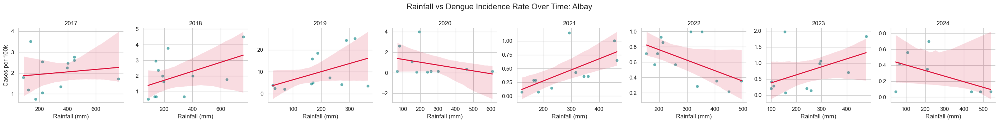

...

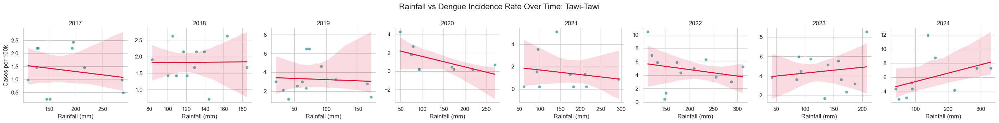

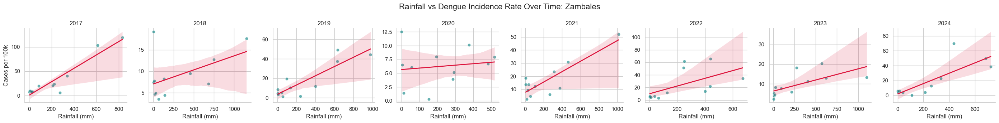

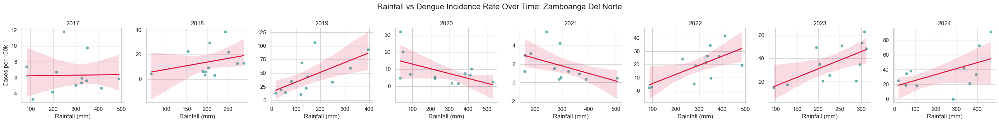

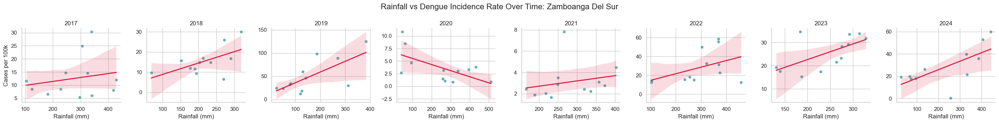

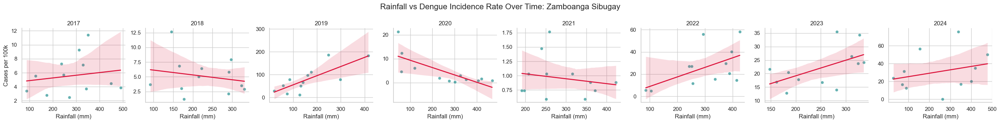

In [41]:
df_clean = df[df[['rfh', 'Per_100k', 'Province', 'Year']].notnull().all(axis=1)].copy()
provinces = df_clean['Province'].unique()

for province in sorted(provinces):
    df_prov = df_clean[df_clean['Province'] == province]
    
    if df_prov.empty:
        continue

    g = sns.FacetGrid(df_prov, col='Year', col_wrap=8, height=3.5, sharex=False, sharey=False)
    g.map_dataframe(sns.scatterplot, x='rfh', y='Per_100k', alpha=0.6, color='teal')
    g.map_dataframe(sns.regplot, x='rfh', y='Per_100k', scatter=False, color='crimson', line_kws={'linewidth': 2})
    g.set_titles("{col_name}")
    g.set_axis_labels("Rainfall (mm)", "Cases per 100k")
    
    g.figure.suptitle(f'Rainfall vs Dengue Incidence Rate Over Time: {province}', fontsize=16)
    plt.subplots_adjust(top=0.88)
    g.tight_layout()
    plt.show()

**To wrap up the project, I developed predictive models to forecast dengue incidence. As part of this process, I reviewed literature on infectious disease forecasting using machine learning. One study I initially considered as a reference was a dengue forecasting model developed collaboratively by the National Environment Agency in Singapore and two of its local universities. Their model used LASSO regression and incorporated a wide range of weekly data — including case counts, population statistics, temperature, humidity, and even vector surveillance data.**

**However, Singapore presents a very different context. It is a small, highly urbanized country with a relatively uniform climatologic profile. In contrast, the Philippines is vast, geographically fragmented, and largely rural with populations distributed unevenly across provinces and regions. Additionally, the archipelago experiences multiple distinct weather patterns throughout the year. Given these differences, and the weak linear relationship between rainfall and dengue incidence that we have already established, I ultimately opted to use the XGBoost algorithm. XGBoost is said to be better suited for handling nonlinear patterns, noise, and missing values — all of which are present in my dataset. It also accommodates the variable seasonality observed across different provinces and can adapt to the sporadic, high-magnitude outbreak spikes. Additionally, it is computationally efficient and known for producing high-accuracy results with structured data.**

**For features, I tested multiple combinations and eventually settled on the following: lagged values of dengue incidence, lagged values of rainfall and rainfall anomalies, incidence deltas, three-month rolling mean, and cyclical encoding of months to reflect seasonal patterns. I used an 80-20 train-test split, with 20% of the training data reserved for validation. Each province underwent its own hyperparameter tuning using randomized search, and models were evaluated using Mean Absolute Error (MAE) and R² scores. All final models were saved for future use.**

**First off, expecting a well-performing model for Batanes using the same conditions as for the other provinces was simply not feasible as the province has barely half the number of months with case records. Otherwise, the resulting models were generally robust. Virtually all of them produced strong training performance (MAE < 10.0; R² > 0.90) and most models were able to capture the overall rising and falling trends in the test set. However, despite extensive experimentation with features, hyperparameters, and even alternative algorithms, one persistent issue remained: the models consistently struggled to predict future incidence values that exceeded any previously encountered during training. As a result, provinces that experienced outbreak peaks late in the time series reflected inflated test MAE values and lower test R² scores, regardless of any tweaking made.**

**Rather than individually customizing models for each of these cases, I maintained a uniform modeling approach and paired the XGBoost results with a quantile regression analysis for all provinces. This allowed me to assess whether the models had learned enough to capture the actual values within a 90% prediction interval. Surprisingly, the quantile ranges were able to cover most of the difficult outbreak peaks, even when the point predictions were off. These results showed that while forecasting accurate outbreak numbers remain a challenge, the models still provide meaningful predictive value by showing trend direction and interval estimates.**

In [43]:
# Feature Engineering
def prepare_features(prov_df):
    prov_df = prov_df.sort_values('Date')
    prov_df['Cases_lag_1'] = prov_df['Per_100k'].shift(1)
    prov_df['Cases_lag_2'] = prov_df['Per_100k'].shift(2)
    prov_df['Cases_lag_3'] = prov_df['Per_100k'].shift(3)
    prov_df['Cases_delta_1_2'] = prov_df['Cases_lag_1'] - prov_df['Cases_lag_2']
    prov_df['Cases_delta_2_3'] = prov_df['Cases_lag_2'] - prov_df['Cases_lag_3']
    prov_df['Cases_delta_1_3'] = prov_df['Cases_lag_1'] - prov_df['Cases_lag_3']
    prov_df['rolling_mean_3'] = prov_df['Per_100k'].shift(1).rolling(3).mean()
    prov_df['rfh_lag_1'] = prov_df['rfh'].shift(1)
    prov_df['rfh_lag_2'] = prov_df['rfh'].shift(2)
    prov_df['rfh_lag_3'] = prov_df['rfh'].shift(3)
    prov_df['r1q_lag_1'] = prov_df['r1q'].shift(1)
    prov_df['r1q_lag_2'] = prov_df['r1q'].shift(2)
    prov_df['r1q_lag_3'] = prov_df['r1q'].shift(3)
    prov_df['Month_sin'] = np.sin(2 * np.pi * prov_df['Month'] / 12)
    prov_df['Month_cos'] = np.cos(2 * np.pi * prov_df['Month'] / 12)
    prov_df = prov_df.dropna(subset=['Per_100k', 'Cases_lag_1', 'Cases_lag_2', 'Cases_lag_3', 'Cases_delta_1_2', 'Cases_delta_2_3', 'Cases_delta_1_3',
                                     'rolling_mean_3', 'rfh_lag_1', 'rfh_lag_2', 'rfh_lag_3', 'r1q_lag_1', 'r1q_lag_2', 'r1q_lag_3', 'Month_sin', 'Month_cos'])
    return prov_df

In [44]:
# Model Training and Evaluation
def run_model_per_province(df):
    results = []
    province_models = {}
    quantile_models = {}
    metrics_summary = []

    features = ['Cases_lag_1', 'Cases_lag_2', 'Cases_lag_3', 'Cases_delta_1_2', 'Cases_delta_2_3', 'Cases_delta_1_3', 'rolling_mean_3',
                'rfh_lag_1', 'rfh_lag_2', 'rfh_lag_3', 'r1q_lag_1', 'r1q_lag_2', 'r1q_lag_3', 'Month_sin', 'Month_cos']

    param_dist = {'n_estimators': [50, 75, 100],
                  'max_depth': [2, 3, 4],
                  'learning_rate': [0.01, 0.05, 0.1],
                  'subsample': [0.6, 0.8, 1.0],
                  'colsample_bytree': [0.6, 0.8, 1.0],
                  'reg_alpha': [0, 0.1, 1, 10],
                  'reg_lambda': [0.5, 1, 2, 5]}

    for province in df['Province'].unique():
        prov_df = df[df['Province'] == province].copy()
        prov_df = prepare_features(prov_df)

        if len(prov_df) < 24:
            print(f"Skipping {province}: insufficient data after feature prep")
            continue

        split_index = int(len(prov_df) * 0.8)
        train_df = prov_df.iloc[:split_index].copy()
        test_df = prov_df.iloc[split_index:].copy()

        val_size = int(len(train_df) * 0.2)
        train_inner_df = train_df.iloc[:-val_size].copy()
        val_inner_df = train_df.iloc[-val_size:].copy()

        X_train_inner = train_inner_df[features]
        y_train_inner = train_inner_df['Per_100k']
        X_val_inner = val_inner_df[features]
        y_val_inner = val_inner_df['Per_100k']
        X_test = test_df[features]
        y_test = test_df['Per_100k']

        base_model = XGBRegressor(objective='reg:squarederror', random_state=42, verbosity=0)
        tscv = TimeSeriesSplit(n_splits=3)
        search = RandomizedSearchCV(base_model,
                                    param_distributions=param_dist,
                                    n_iter=50,
                                    scoring='neg_mean_absolute_error',
                                    cv=tscv,
                                    verbose=0,
                                    n_jobs=-1,
                                    random_state=42)
        search.fit(X_train_inner, y_train_inner)
        best_params = search.best_params_
        final_model = XGBRegressor(**best_params, objective='reg:squarederror', random_state=42, verbosity=0)

        X_train_full = pd.concat([X_train_inner, X_val_inner])
        y_train_full = pd.concat([y_train_inner, y_val_inner])

        final_model.fit(X_train_full, y_train_full)
        province_models[province] = final_model
        model_filename = f"{province}_xgboost_model.joblib"
        joblib.dump(final_model, model_filename)
        print(f"Saved model for {province} to {model_filename}")

        y_train_pred = np.clip(final_model.predict(X_train_full), 0, None)
        y_test_pred = np.clip(final_model.predict(X_test), 0, None)

        quantiles = [0.05, 0.5, 0.95]
        quantile_preds = {}
        pinball_losses = {}
        for q in quantiles:
            qr = QuantileRegressor(quantile=q, alpha=0)
            qr.fit(X_train_full, y_train_full)
            pred_q = np.clip(qr.predict(X_test), 0, None)
            quantile_preds[q] = pred_q
            pinball_losses[q] = mean_pinball_loss(y_test, pred_q, alpha=q)

        quantile_models[province] = quantile_preds

        train_mae = mean_absolute_error(y_train_full, y_train_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)
        train_r2 = r2_score(y_train_full, y_train_pred)
        test_r2 = r2_score(y_test, y_test_pred)

        metrics_summary.append({'Province': province,
                                'Train MAE': round(train_mae, 2),
                                'Train R²': round(train_r2, 2),
                                'Test MAE': round(test_mae, 2),
                                'Test R²': round(test_r2, 2),
                                'PinballLoss@5': round(pinball_losses[0.05], 2),
                                'PinballLoss@50': round(pinball_losses[0.5], 2),
                                'PinballLoss@95': round(pinball_losses[0.95], 2)})

        train_df_full = pd.concat([train_inner_df, val_inner_df])
        train_df_full['Predicted_Per_100k'] = y_train_pred
        test_df['Predicted_Per_100k'] = y_test_pred
        for q in quantiles:
            test_df[f'Quantile_{int(q * 100)}'] = quantile_preds[q]

        combined = pd.concat([train_df_full, test_df])
        results.append(combined)

    metrics_df = pd.DataFrame(metrics_summary).sort_values('Test MAE')
    print("\n--- Model Evaluation Summary (sorted by Test MAE) ---")
    print(metrics_df.to_string(index=False))

    all_results = pd.concat(results)
    return all_results, province_models, quantile_models, metrics_df

Saved model for Abra to Abra_xgboost_model.joblib
Saved model for Agusan Del Norte to Agusan Del Norte_xgboost_model.joblib
Saved model for Agusan Del Sur to Agusan Del Sur_xgboost_model.joblib
Saved model for Aklan to Aklan_xgboost_model.joblib
Saved model for Albay to Albay_xgboost_model.joblib
Saved model for Antique to Antique_xgboost_model.joblib
Saved model for Apayao to Apayao_xgboost_model.joblib
Saved model for Aurora to Aurora_xgboost_model.joblib
Saved model for Basilan to Basilan_xgboost_model.joblib
Saved model for Bataan to Bataan_xgboost_model.joblib
Saved model for Batanes to Batanes_xgboost_model.joblib
Saved model for Batangas to Batangas_xgboost_model.joblib
Saved model for Benguet to Benguet_xgboost_model.joblib
Saved model for Biliran to Biliran_xgboost_model.joblib
Saved model for Bohol to Bohol_xgboost_model.joblib
Saved model for Bukidnon to Bukidnon_xgboost_model.joblib
Saved model for Bulacan to Bulacan_xgboost_model.joblib
Saved model for Cagayan to Cagayan_x

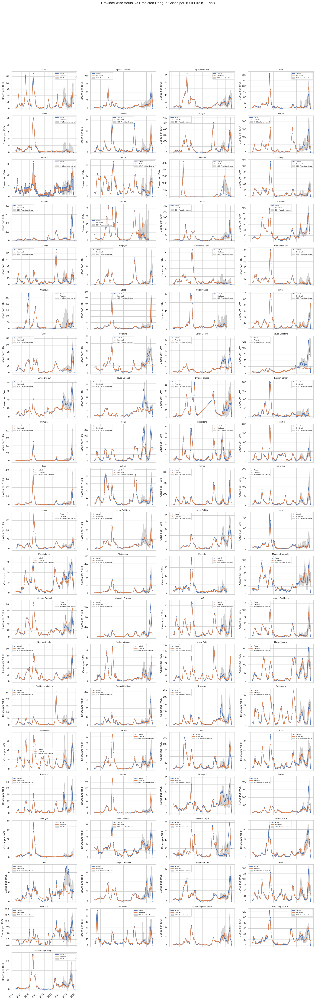

In [45]:
# Plotting
def plot_results(all_results):
    provinces = all_results['Province'].unique()
    n_cols = 4
    n_rows = -(-len(provinces) // n_cols)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 3), sharex=True)
    axs = axs.flatten()

    all_results = all_results.replace([np.inf, -np.inf], np.nan)
    all_results = all_results.dropna(subset=['Per_100k', 'Predicted_Per_100k'])

    for i, prov in enumerate(provinces):
        ax = axs[i]
        data = all_results[all_results['Province'] == prov]
        ax.plot(data['Date'], data['Per_100k'], label='Actual', marker='o', markersize=3)
        ax.plot(data['Date'], data['Predicted_Per_100k'], label='Predicted', marker='x', markersize=3)
        if f'Quantile_5' in data.columns and f'Quantile_95' in data.columns:
            ax.fill_between(data['Date'],
                            data['Quantile_5'],
                            data['Quantile_95'],
                            color='gray',
                            alpha=0.3,
                            label='90% Prediction Interval')
        ax.set_title(prov, fontsize=9)
        ax.grid(True)
        ax.legend(fontsize=7)
        ax.set_ylabel('Cases per 100k')
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

    for j in range(i + 1, len(axs)):
        axs[j].set_visible(False)

    plt.tight_layout()
    plt.suptitle("Province-wise Actual vs Predicted Dengue Cases per 100k (Train + Test)", fontsize=16, y=1)
    plt.subplots_adjust(top=0.93)
    plt.show()

# Execution
df = df.sort_values(['Province', 'Year', 'Month']).copy()
df['Date'] = pd.to_datetime(df[['Year', 'Month']].assign(DAY=1))
all_results, province_models, quantile_models, metrics_df = run_model_per_province(df)
plot_results(all_results)

**Below are tools I set up to further evaluate the predictions made by the models. The first one shows the residuals, indicating how far the predicted count deviates from the actual for any given province. Next, the SHAP explainer tools display which of the features heavily influenced the predictions for a particular province. The first two plots - the beeswarm and bar plots - highlight the most important features for the overall model predictions, showing both the magnitude and direction of each feature’s impact. These plots help identify which variables consistently drive the model’s decisions across the entire dataset of a province. Meanwhile, the third SHAP plot - the waterfall plot - breaks down the contribution of each feature to a single prediction, showing how each variable increases or decreases the predicted value relative to the model’s average output.**

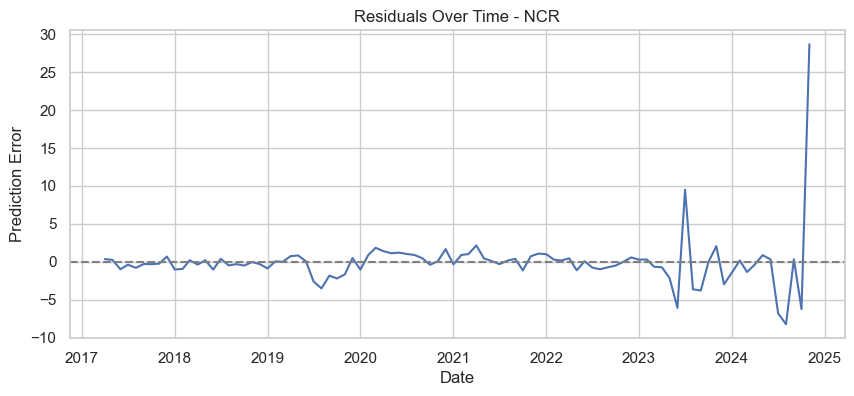

In [47]:
selected_prov = 'NCR'     # Change this to check different provinces
prov_data = all_results[all_results['Province'] == selected_prov].copy()
prov_data['Residuals'] = prov_data['Predicted_Per_100k'] - prov_data['Per_100k']

plt.figure(figsize=(10, 4))
sns.lineplot(x='Date', y='Residuals', data=prov_data)
plt.axhline(0, linestyle='--', color='gray')
plt.title(f'Residuals Over Time - {selected_prov}')
plt.ylabel("Prediction Error")
plt.show()

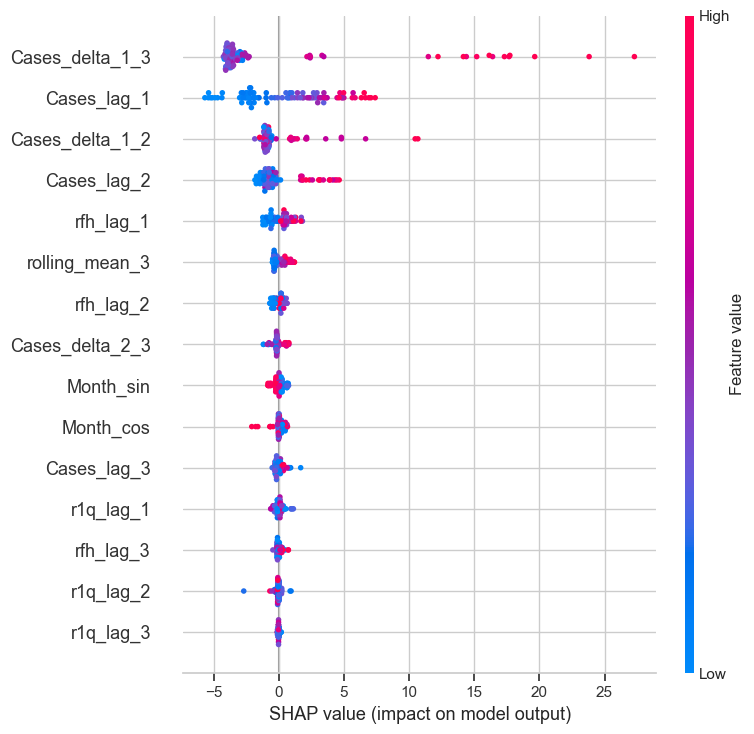

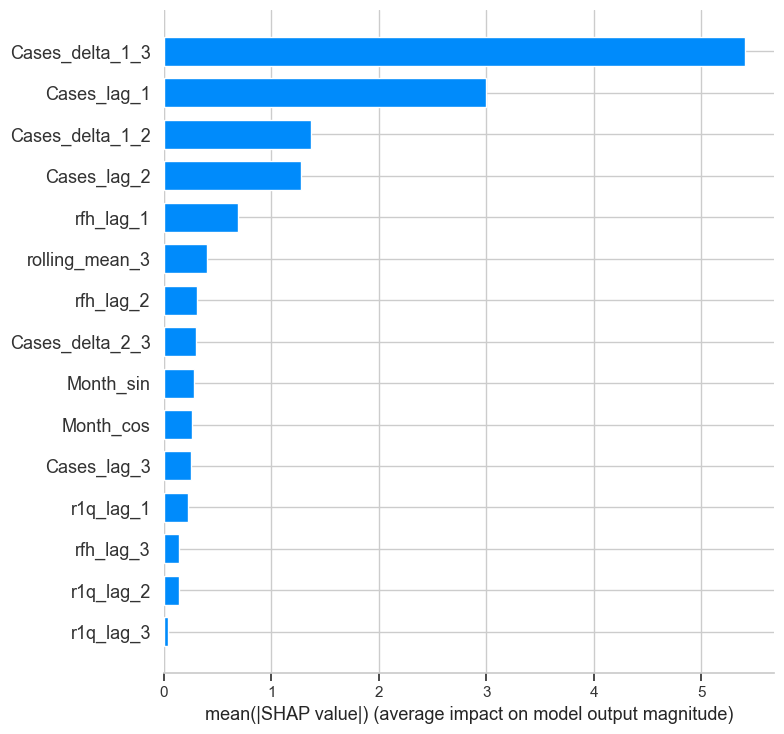

In [ ]:
selected_province = 'NCR'  # Change this to check different provinces

model = province_models[selected_province]
prov_data = df[df['Province'] == selected_province].copy()
prov_data = prepare_features(prov_data)
features = ['Cases_lag_1', 'Cases_lag_2', 'Cases_lag_3', 'Cases_delta_1_2', 'Cases_delta_2_3', 'Cases_delta_1_3', 'rolling_mean_3',
            'rfh_lag_1', 'rfh_lag_2', 'rfh_lag_3', 'r1q_lag_1', 'r1q_lag_2', 'r1q_lag_3', 'Month_sin', 'Month_cos']
X = prov_data[features].replace([np.inf, -np.inf], np.nan).dropna()

explainer = shap.Explainer(model)
shap_values = explainer(X)

shap.summary_plot(shap_values, X, show=True) # Beeswarm plot
shap.summary_plot(shap_values, X, plot_type="bar", show=True) # Bar plot
sample_index = -1  
shap.plots.waterfall(shap_values[sample_index], max_display=15) # Waterfall plot

**To end, this project has been both a fun and eye-opening exercise for me. As a Filipino who has lived through countless rainy seasons and has personally known people affected by dengue over the years, I found that this analysis uncovered insights I wouldn't have discovered otherwise. What fascinated me most was that beyond the statistics and data science concepts, I unexpectedly gained a deeper understanding about various topics within the Philippine context — geography, climatology, history, politics, vector biology, sociology, and public health.**

**In conclusion, this project has shown that on a nationwide level, rainfall intensity alone does not necessarily influence the magnitude of dengue infections. On a more granular scale such as individual provinces or local barangays, this relationship may vary. However, at the level of analysis this project focused on, it became clear that multiple factors, alongside rainfall, contribute to disease progression in the Philippines. This highlights a very important need for more accurate, consistent, and expansive data collection on other potential factors. Only then can we fully understand the underlying dynamics and design more effective intervention and response programs to sustainably combat dengue across the country.**